# Анализ рынка заведений общественного питания в Москве

В проекте проанализируем рынок заведений общественного питания в Москве:
- посмотрим, как они распредены по категориям (рестораны, кофейни, пиццерии, бары и т.д.);
- узнаем, какое сооотношение сетевых и несетевых заведений;
- найдем 15 сетей с наибольшим количеством заведений;
- построим интерактивную карту распределения заведений по районам;
- оценим средний рейтинг в разных категориях и разных районах, а также средний чек;
- определим 15 улиц с наибольшим количеством заведений общепита.

Более подробно остановимся на категории кофеен:
- рассмотрим их распредение по районам;
- найдем долю круглосуточных;
- оценим влияние района на рейтинг;
- определимся со средней стоимостью чашки капучино.

Как итог: попробуем дать некоторые рекомендации для открытия кофейни в Москве, прообразом которой могло бы быть то самое место из "Друзей".

## Загрузка и знакомство с исходными данными 

Импорт необходимых библиотек

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np 
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

Загрузим исходные данные и выведем общую информацию о нашем датафрейме.

In [2]:
df = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


- В нашей выборке представлено 8406 заведений;
- В столбцах с режимом работы, с ценовой категорией и с количеством посадочных мест есть пропуски;
- В столбцах со средней стоимостью заказа и, соответственно, с оценкой среднего чека и оценкой одной чашки капучино тоже есть пропуски;
- Тип данных в столбце chain (является ли заведение сетевым) необходимо заменить на bool. В остальных столбцах тип данных соответствует отраженной в столбце информации.

In [4]:
df['chain'] = df['chain'].astype('bool')

## Предобработка данных

Названия столбцов логичны и уже приведены к змеиному регистру - их менять не будем.

### Обработка выбросов

Построим графики распределения значений по всем столцбам с числовыми типами данных.

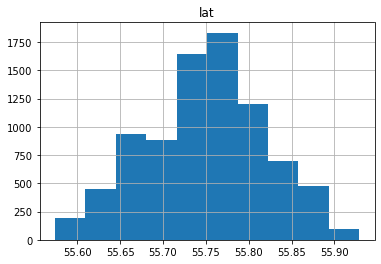

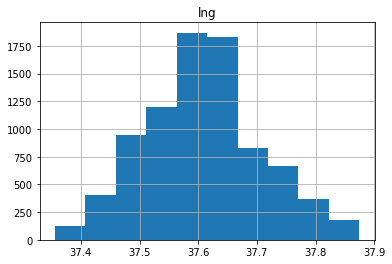

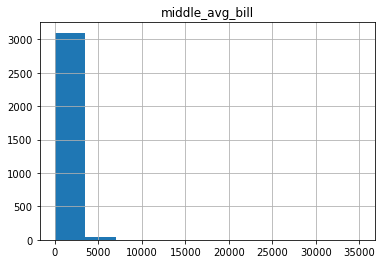

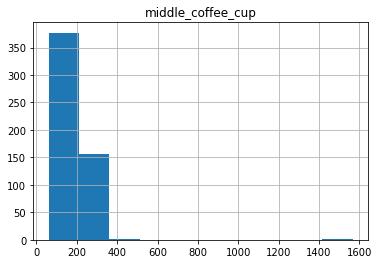

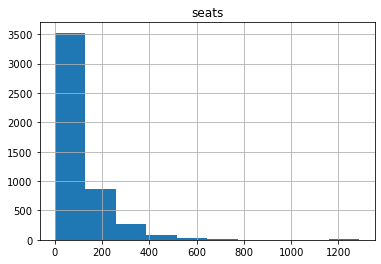

In [5]:
for col in ['lat', 'lng', 'middle_avg_bill', 'middle_coffee_cup', 'seats']:
    t = df[df[col] != 'no_info']
    t[col].hist()
    plt.title(col)
    plt.show()

К распределению широты и долготы - вопросов нет.

Но можно посмотреть на процентили у среднего чека, средней стоимости чашки капучино и количества посадочных мест. 

In [6]:
df[df['middle_avg_bill'] != 'no_info'].middle_avg_bill.quantile(0.999)

7213.000000000079

Только у 0,1% заведений средний чек больше 7213. Пометим такие заведения флажком 'out_check'.

In [7]:
df['out_check'] = df['middle_avg_bill'] > 7213

Теперь посмотрим верхний 0,1% по стоимости чашки кофе.

In [8]:
df.middle_coffee_cup.quantile(0.999)

930.9380000000098

Также пометим флагом - 'out_coffee'

In [9]:
df['out_coffee'] = df['middle_coffee_cup'] > 930

И наконец - 1% заведений с наибольшим количеством посадочных мест.

In [10]:
df.seats.quantile(0.99)

625.0

Здесь будет флаг - 'out_seats'

In [11]:
df['out_seats'] = df['seats'] > 625

### Обработка пропусков

Нам уже известно, что в нескольких столбцах нашего датафрейма присутствуют пропуски.

Осуществлять замену пропусков на какие-то приблизительные, кажущиеся логичными значения не будем, так как это неизбежно приведет к искажению исходных данных.

Заменим пропуски в столбцах hours, price, avg_bill, где тип данных object, на "нет информации". Так, при дальнейшем исследовании интересующих нас параметров мы всегда будем видеть, у какой доли данных информация об этом параметре отсутствует.

В столбцах с численными значениями оставим пропуски пропусками.

In [12]:
for col in ['hours', 'price', 'avg_bill']:
    df[col] = df[col].fillna('нет информации')

### Обработка дубликатов

Посмотрим есть ли в нашем датафрейме дубликаты

In [13]:
df.duplicated().sum()

0

Дубликатов нет. 

Посмотрим, нет ли у нас неявных дубликатов в категориях заведений.

In [14]:
df['category'].unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

В столбце с категориями дубликатов нет.

Возможно, одно и то же заведение могло попасть в нашу выборку несколько раз. Проверим. 

In [15]:
df[['name', 'address']].duplicated().sum()

0

Таких дубликатов тоже нет. 

### Добавление столбца с названием улицы

In [16]:
df['street'] = df['address'].apply(lambda x: x.split(',')[1].strip())

In [17]:
t['street'] = df['street']
t['not_st'] = t['street'].str.contains('улица|ул.|проспект|переулок|проезд|тупик|площадь|шоссе|набережная|МКАД|проезд|бульвар|сквер|сад|аллея|парк|заказник', regex=True)
t['not_st'].sum()/len(t)

0.9863192957411373

### Добавление столбца-флага, обозначающего круглосуточную работу заведения

In [18]:
df['24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

## Анализ данных

### Распределение заведений по категориям

In [19]:
df.groupby('category').agg({'name': 'count'}).sort_values(by='name', ascending=False).reset_index()

,category,name
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


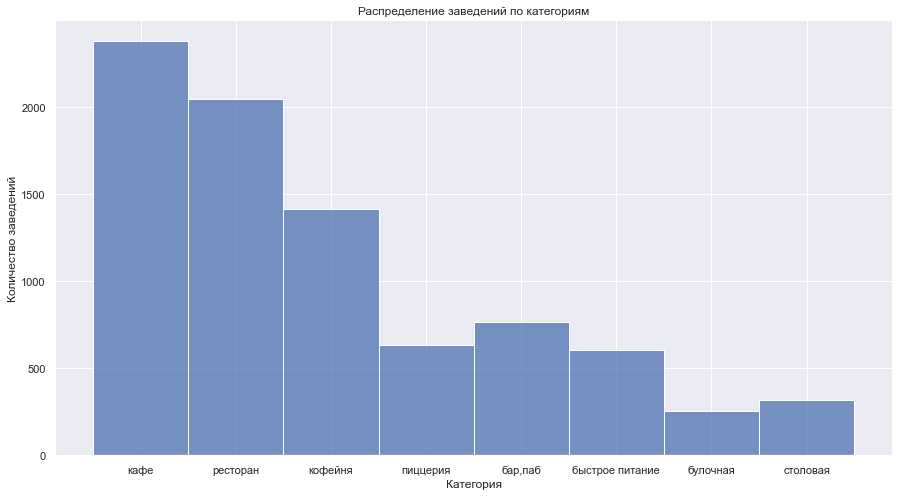

In [20]:
sns.set_style('dark')
sns.set(rc={'figure.figsize':(15,8)})

ax = sns.histplot(x='category', data=df)
plt.title('Распределение заведений по категориям')
plt.ylabel('Количество заведений')
plt.xlabel('Категория')
plt.show()

- Категории "Кафе" и "Рестораны" - представлены нашей выборке наибольшим числом заведений;
- Чуть меньше в нашей выборке кофеен;
- Меньше всего, судя по нашей выборке, в Москве булочных и столовых.

### Количество посадочных мест в разных категориях заведений

In [21]:
t = t.groupby('category').agg({'seats': 'median'}).sort_values(by='seats', ascending=False).reset_index()
t

,category,seats
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


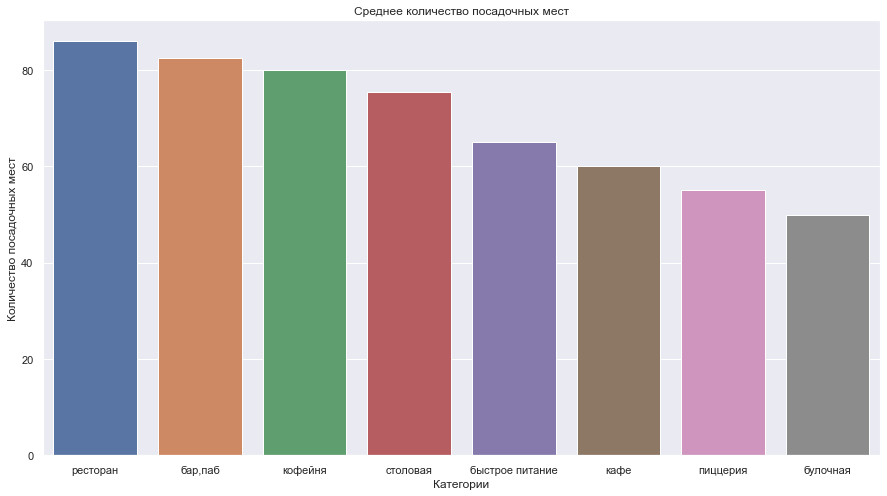

In [22]:
ax = sns.barplot(x='category', y='seats', data=t)
plt.title('Среднее количество посадочных мест')
plt.ylabel('Количество посадочных мест')
plt.xlabel('Категории')
plt.show()

- Для оценки среднего количества посадочных мест используем медиану, а не среднее, так как мы уже увидели, что в нашей выборке присутствуют заведения с выдающейся вместимостью. А такие значения оказывают сильное влияние на среднее арифметическое;
- Разница в среднем количестве посадочных мест между категориями заведений не значительная;
- Можно утверждать, что в среднем количество посадочных мест в ресторанах, барах, пабах, кофейнях и столовых примерно одинаковое;
- В булочных в среднем сильно меньше посадочных мест, чем в остальных категориях.

### Сетевые и несетевые заведения

In [23]:
t = df.groupby('chain').agg({'name': 'count'}).rename(columns={'name': 'count'}).reset_index()
t

,chain,count
0,False,5201
1,True,3205


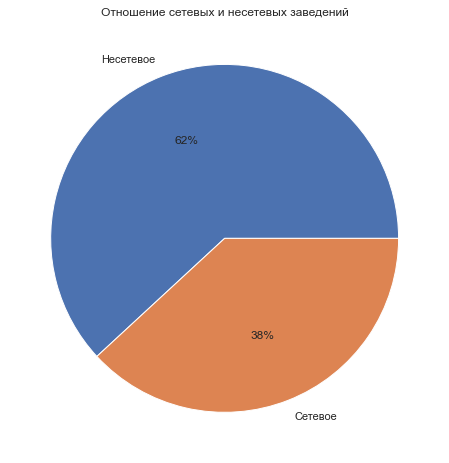

In [24]:
plt.pie(t['count'], labels=['Несетевое', 'Сетевое'], autopct='%1.0f%%')
plt.title('Отношение сетевых и несетевых заведений')
plt.show()

Несетевых заведений в нашей выборке примерно в 1,5 раза больше, чем сетевых.

### Сетевые и несетевые заведения в разных категориях

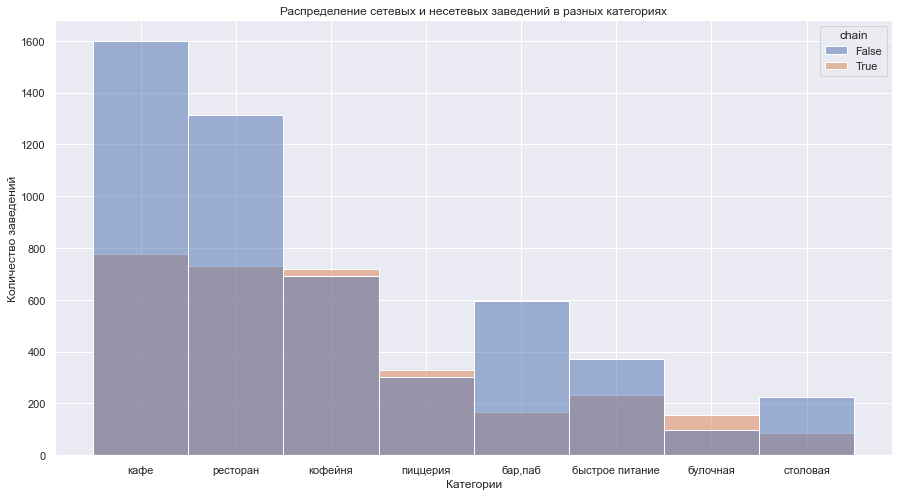

In [25]:
ax = sns.histplot(data=df, x='category', hue='chain')
plt.title('Распределение сетевых и несетевых заведений в разных категориях')
plt.ylabel('Количество заведений')
plt.xlabel('Категории')
plt.show()

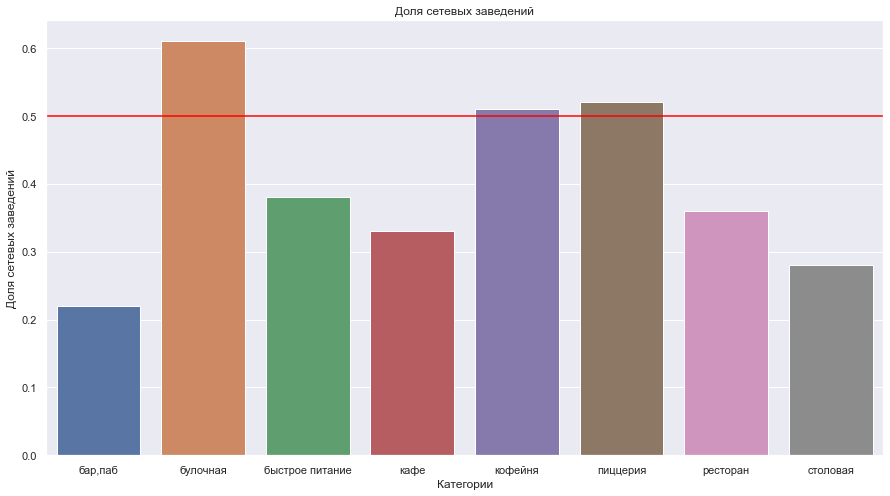

In [26]:
t = df.groupby('category', as_index=False).agg({'chain': 'sum', 'name': 'count'})\
.rename(columns={'name': 'total'})
t['chain_pct'] = (t['chain'] / t['total']).round(2)

ax = sns.barplot(x='category', y='chain_pct', data=t)
plt.axhline(y=0.5, xmin=0, xmax= 1, color='red')
plt.title('Доля сетевых заведений')
plt.ylabel('Доля сетевых заведений')
plt.xlabel('Категории')
plt.show()

- Обычно количество несетевых заведений значительно превышает количество сетевых в рамках одной категории;
- Выделяются кофейни и пиццерии, в которых количество сетевых точек немного превышает количество несетевых;
- Только в категории булочных можно говорить о том, что количество сетевых заведений значительно больше количества несетевых.

### ТОП-15 популярных сетей в Москве

In [27]:
df.groupby('name').agg({'street': 'count'})\
.rename(columns={'street': 'count'})\
.sort_values(by='count', ascending=False)\
.head(15)

,count
name,
Кафе,189
Шоколадница,120
Домино'с Пицца,76
Додо Пицца,74
One Price Coffee,71
Яндекс Лавка,69
Cofix,65
Prime,50
Хинкальная,44


- В нашей выборке стречается довольно много заведений со стандартными названиями: "кафе", "шаурма", "ресторан" и "столовая". Вероятнее всего, это не одна сеть, а маленькие независимые друг от друга заведения. Поэтому отфильтруем такие названия из нашей выборки и попробуем найти ТОП-15 сетей еще раз.

In [28]:
 t = df[-df['name'].isin(['Кафе', 'Шаурма', 'Ресторан', 'Столовая'])].groupby('name').agg({'street': 'count'})\
.rename(columns={'street': 'count'})\
.sort_values(by='count', ascending=False)\
.reset_index()\
.head(15)
t

,name,count
0,Шоколадница,120
1,Домино'с Пицца,76
2,Додо Пицца,74
3,One Price Coffee,71
4,Яндекс Лавка,69
5,Cofix,65
6,Prime,50
7,Хинкальная,44
8,КОФЕПОРТ,42
9,Кулинарная лавка братьев Караваевых,39


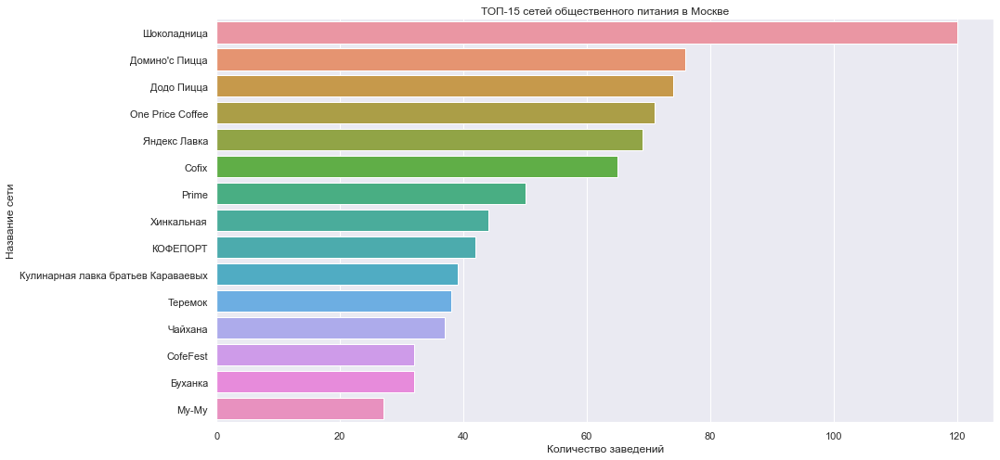

In [29]:
ax = sns.barplot(x='count', y='name', data=t)
plt.title('ТОП-15 сетей общественного питания в Москве')
plt.ylabel('Название сети')
plt.xlabel('Количество заведений')
plt.show()

- Абсолютный лидер по количеству заведений среди сетей - Шоколадница;
- На втором месте - Домино'c пицца, которая несильно опережает Додо-пиццу;
- Замыкает ТОП-15 - сеть Му-Му;
- Стоит отметить что в среди 15 сетей с наибольшим количеством заведений - 5 кофейни (если рассмативать Шоколадницу, как кофейню). 

Посмотрим, как распределяются категории из ТОП-15 сетей по районам.

In [30]:
t = pd.pivot_table(df[df['name'].isin(t['name'])], 
              index='category',
              columns='district',
              values='name',
              aggfunc='count'
              )
t

district,Восточный административный округ,Западный административный округ,Северный административный округ,Северо-Восточный административный округ,Северо-Западный административный округ,Центральный административный округ,Юго-Восточный административный округ,Юго-Западный административный округ,Южный административный округ
category,,,,,,,,,
"бар,паб",2.0,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN
булочная,1.0,5.0,8.0,6.0,3.0,1.0,NaN,1.0,NaN
быстрое питание,2.0,1.0,NaN,2.0,2.0,2.0,2.0,1.0,NaN
кафе,6.0,8.0,7.0,6.0,1.0,47.0,12.0,9.0,4.0
кофейня,30.0,41.0,40.0,37.0,20.0,94.0,15.0,25.0,34.0
пиццерия,20.0,15.0,20.0,19.0,13.0,9.0,16.0,16.0,23.0
ресторан,18.0,18.0,13.0,15.0,7.0,59.0,11.0,17.0,28.0
столовая,1.0,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN


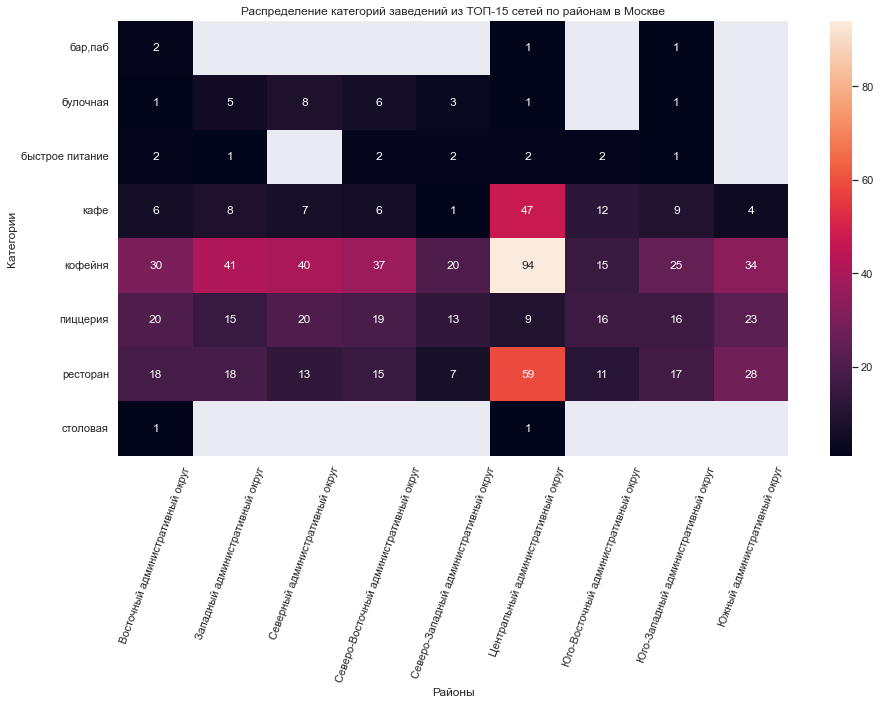

In [31]:

ax = sns.heatmap(t, annot=True)
plt.title('Распределение категорий заведений из ТОП-15 сетей по районам в Москве')
plt.ylabel('Категории')
plt.xlabel('Районы')
plt.xticks(rotation=70)
plt.show()

- Вполне логично в ЦАО выделяются количества сетевых кофеен (94), ресторанов (59) и кафе (47);
- Также можно отметить количество кофеен в Западном, Северном и Северно-Восточном округах - там количество сетевых кофеен примерно в 2 раза выше, чем в других округах (за исключением Центрального).

### Распределение всех заведений по районам 

Теперь посмотрим: как распределились по районам категории всех заведений, а не только сетевых.

Для начала посмотрим, все ли районы представлены в нашей выборке.

In [32]:
df['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

У нас есть все районы. Посмотрим, как по ним распределяются категории. 

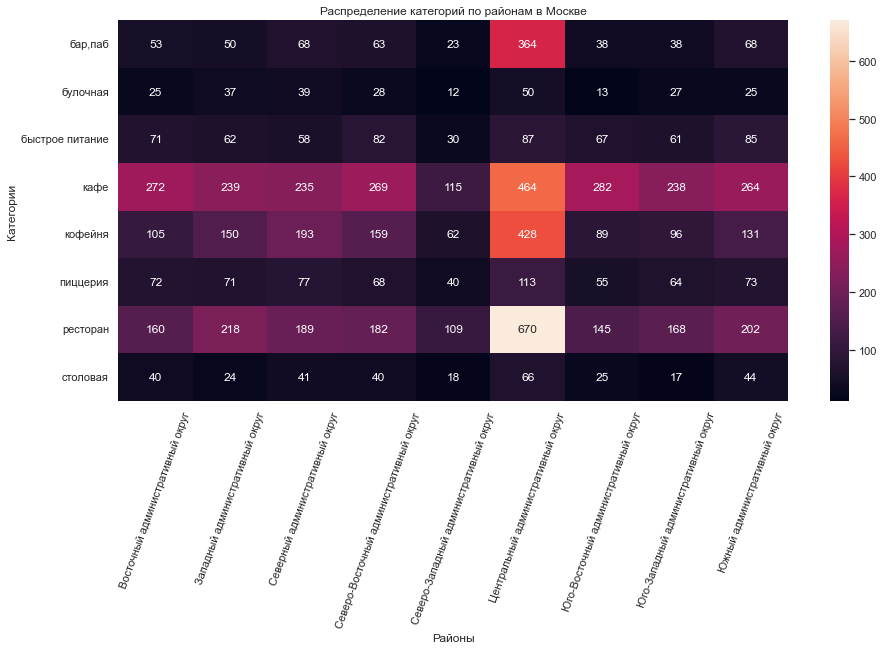

In [33]:
t = pd.pivot_table(df, 
              index='category',
              columns='district',
              values='name',
              aggfunc='count'
              )

plt.figure(figsize=(15, 7))
ax = sns.heatmap(t, annot=True, fmt='g')
plt.title('Распределение категорий по районам в Москве')
plt.ylabel('Категории')
plt.xlabel('Районы')
plt.xticks(rotation=70)
plt.show()

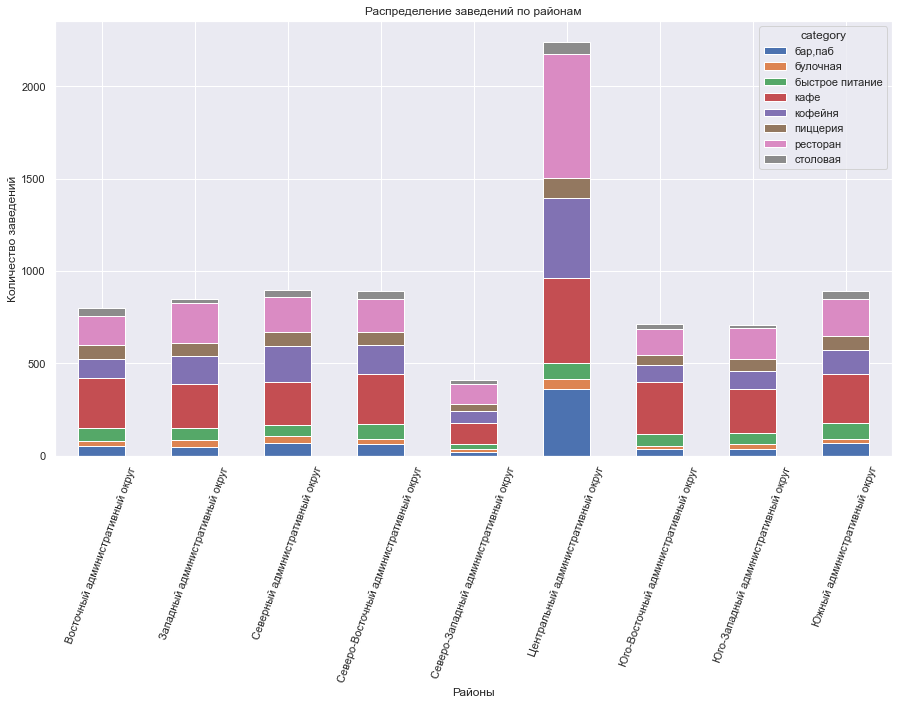

In [34]:
t = pd.pivot_table(df, 
              index='district',
              columns='category',
              values='name',
              aggfunc='count'
              )

ax = t.plot(kind='bar', stacked=True)
plt.title('Распределение заведений по районам')
plt.ylabel('Количество заведений')
plt.xlabel('Районы')
plt.xticks(rotation=70)
plt.show()

- количество заведений по почти всем категориям, открытых в центре, в несколько раз превышает количество заведений, открытых в других районах;
- чуть менее значительная разница в количестве заведений между центром и остальными районами в категориях "столовая", "быстрое питание" и "булочная";
- ТОП-3 категории заведений в центре - ресторан, кафе и кофейня;
- можно выделить Северо-Западный округ - в нем минимальное количество заведений в каждой категории.

### Средние рейтинги категорий

In [35]:
t = df.groupby('category').agg({'rating': ['mean', 'median', 'count']}).reset_index()
t

category    rating             
                        mean median count
0          бар,паб  4.387712    4.4   765
1         булочная  4.268359    4.3   256
2  быстрое питание  4.050249    4.2   603
3             кафе  4.123886    4.2  2378
4          кофейня  4.277282    4.3  1413
5         пиццерия  4.301264    4.3   633
6         ресторан  4.290357    4.3  2043
7         столовая  4.211429    4.3   315

Видно, что в рейтингах выбросов, оказывающих сильное влияние на среднее арифметическое нет. Но лучше в качестве "среднего" все равно будем использовать медиану.

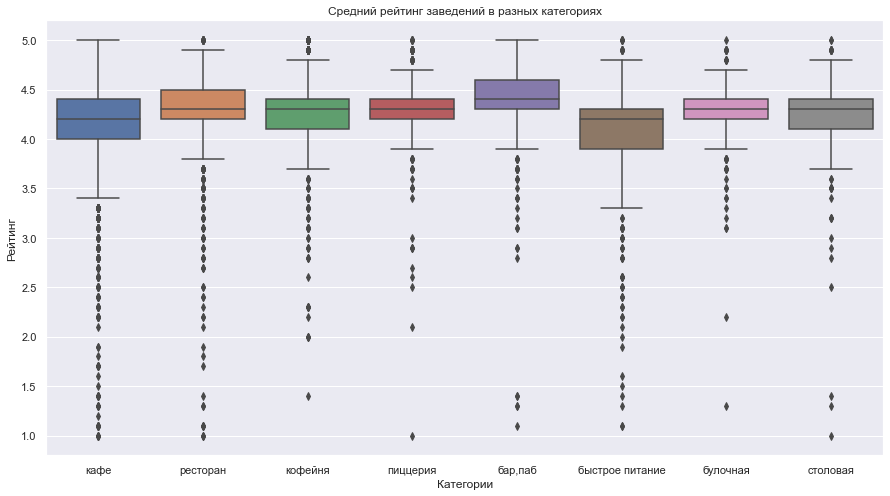

In [36]:
sns.boxplot(x=df['category'], y=df['rating'] )
plt.title('Средний рейтинг заведений в разных категориях')
plt.ylabel('Рейтинг')
plt.xlabel('Категории')
plt.show()

Средний рейтинг заведений в разных категориях примерно одинаковый и составляет 4.2-4.3.

Однако судя по графику, можно отметить, что 50% баров и пабов имеют рейтинг чуть выше, чем аналогичная доля заведений в других категориях.

### Средние рейтинги заведений в разных районах

In [37]:
df_rating = df.groupby('district', as_index=False)['rating'].agg('median')
df_rating.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


Здесь также будем опираться на показатель "медианного" рейтинга. Видно, что он, как и в случае с распределением по категориям, не сильно зависит от района. Посмотрим, как это выглядит на карте.

In [38]:
# загружаем JSON-файл с границами округов Москвы
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=df_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

- Лучшие по среднему рейтингу заведения - в Центральном районе;
- Худшие - на Северо-Востоке и Юго-Востоке;
- Остальные районы имеют одинаковый рейтинг.

Такие выводы можно сделать, смотря на карту. Однако сами рейтинги между районами отличаются не сильно: 
- максимальный - 4.4;
- минимальный - 4.2.

### Все заведения из нашего датафрейма на карте

In [39]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

- Эта визуализация - еще одно подтверждение факта: больше всего общепита в центре;
- Довольно большое количество заведений на Северо-Западе и на Юго-Западе;
- Масштаб карты можно менять - кластеру буду автоматически перегруппировываться. При должном уронвне приближения - можно рассмореть отдельные заведения.

### ТОП-15 улиц по количеству заведений

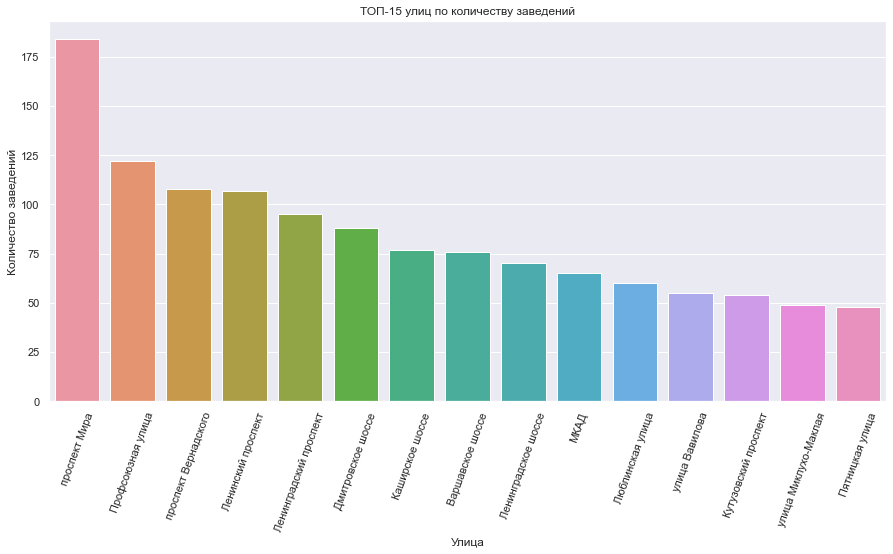

In [40]:
top_streets = df.groupby('street', as_index=False)['name'].count()\
.rename(columns={'name': 'names_count'})\
.sort_values(by='names_count', ascending=False)\
.head(15)

plt.figure(figsize=(15, 7))
ax = sns.barplot(data=top_streets, x='street', y='names_count')
plt.title('ТОП-15 улиц по количеству заведений')
plt.ylabel('Количество заведений')
plt.xlabel('Улица')
plt.xticks(rotation=70)
plt.show()

- Абсолютный лидер по количеству заведений - проспект Мира;
- На втором месте - Профсоюзная улица;
- Третье место делят - проспект Вернадского и Ленинский проспект.

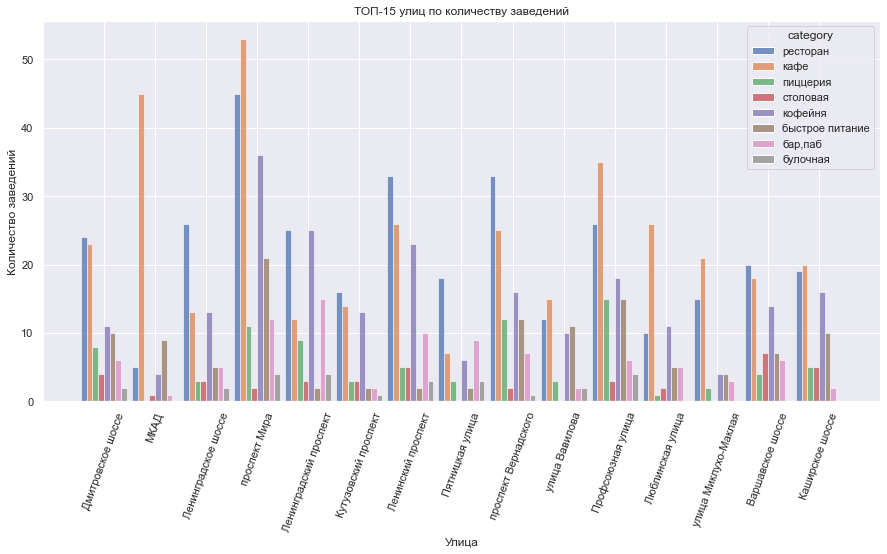

In [41]:
plt.figure(figsize=(15, 7))
ax = sns.histplot(x='street', hue='category', data=df[df['street'].isin(top_streets['street'])], multiple="dodge", shrink=.9)
plt.title('ТОП-15 улиц по количеству заведений')
plt.ylabel('Количество заведений')
plt.xlabel('Улица')
plt.xticks(rotation=70)
plt.show()

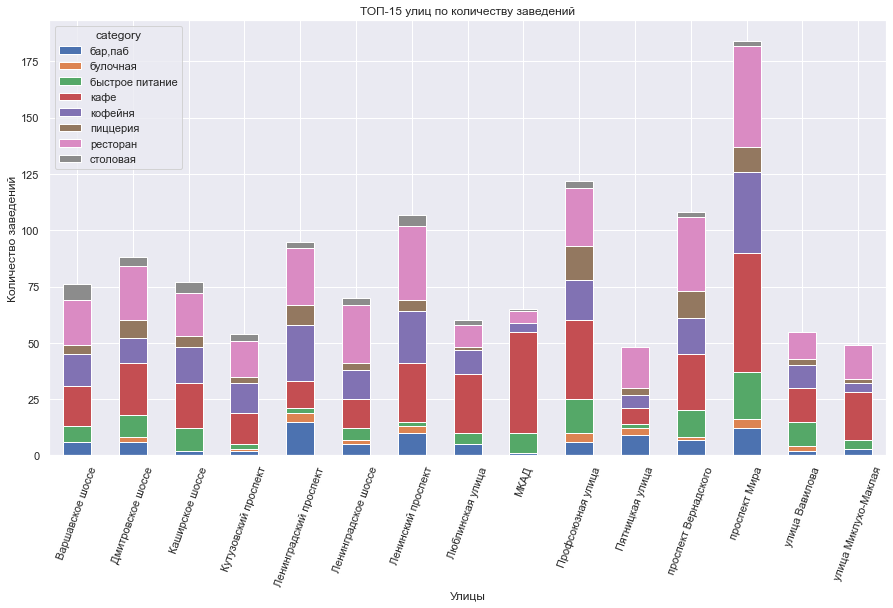

In [42]:
t = pd.pivot_table(df[df['street'].isin(top_streets['street'])], 
              index='street',
              columns='category',
              values='name',
              aggfunc='count'
              )

ax = t.plot(kind='bar', stacked=True)
plt.title('ТОП-15 улиц по количеству заведений')
plt.ylabel('Количество заведений')
plt.xlabel('Улицы')
plt.xticks(rotation=70)
plt.show()

- На проспекте Мира - лидере по общему количесву заведений - и Профсоюзной улице больше всего кафе;
- На Ленинском проспекте и проспекте Вернадского категория-лидер - рестораны; 
- Можно отметить МКАД, который только на 10 месте по общему количеству заведений, но второй по количеству кафе - скорее всего, это множество придорожных точек.

### Улицы с одним объектом общепита

In [43]:
t = df.groupby('street', as_index=False)['name'].count()\
.rename(columns={'name': 'names_count'})
t = t[t['names_count'] == 1]
t.head(20)

,street,names_count
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
6,1-й Грайвороновский проезд,1
7,1-й Дербеневский переулок,1
9,1-й Земельный переулок,1
10,1-й Капотнинский проезд,1
11,1-й Кирпичный переулок,1


In [44]:
print('средний рейтинг', df[df['street'].isin(t['street'])].rating.mean())
print('медианный рейтинг', df[df['street'].isin(t['street'])].rating.median())
print('медианный средний чек', df[df['street'].isin(t['street'])].middle_avg_bill.median())
print('медианное количество посадочных мест', df[df['street'].isin(t['street'])].seats.median())
df[df['street'].isin(t['street'])].category.value_counts(normalize=True)

средний рейтинг 4.236681222707425
медианный рейтинг 4.3
медианный средний чек 625.0
медианное количество посадочных мест 45.0


кафе               0.349345
ресторан           0.203057
кофейня            0.183406
бар,паб            0.085153
столовая           0.078603
быстрое питание    0.050218
пиццерия           0.032751
булочная           0.017467
Name: category, dtype: float64

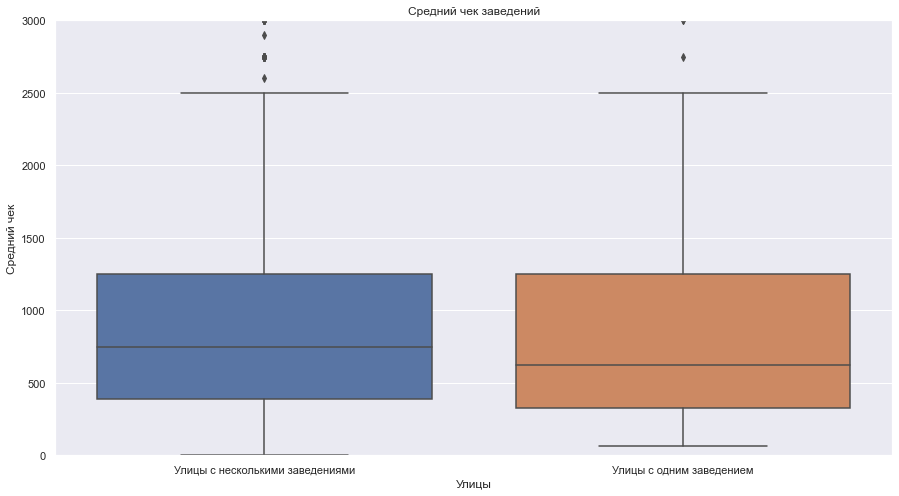

In [45]:
for_boxplot = pd.DataFrame()

for_boxplot['bill'] = df.middle_avg_bill
for_boxplot['One_rest_one_street'] = df['street'].isin(t['street'])

ax = sns.boxplot(x=for_boxplot['One_rest_one_street'], y=for_boxplot['bill'] )
plt.title('Средний чек заведений')
plt.ylabel('Средний чек')
plt.xlabel('Улицы')
plt.ylim([0,3000])
ax.set_xticklabels(['Улицы с несколькими заведениями', 'Улицы с одним заведением'])
plt.show()

- Скорее всего, все эти заведения находятся на очень коротких улицах;
- Большинство заведений на таких улицах относятся к категории "кафе" (35%). Также много ресторанов (20%) и кофеен (18%);
- Медианный средний чек на таких улицах чуть ниже, чем в целом по городу за исключением этих улиц (625 против 750);
- Рейтинг заведений на таких улицах можно сказать не отличается от рейтинга заведений в целом по городу.

### Средний чек в ресторанах в разных районах

Для построения карты распределения средних чеков по районам отфильтруем заведения, у которых нет информации о среднем чеке и заведения с огромными показателями среднего чека, которые можно считать выбросами.

Также возьмем только самую популярую категорию - рестораны, так как очевидно, что средний чек в столовой сильно отличается от среднего чека в ресторане. Исключим фактор категории заведения.

In [46]:
prices = df[(df['out_check']==False)&(df['category']=='ресторан')]

prices.groupby('district').agg({'middle_avg_bill': ['mean', 'count']})

middle_avg_bill      
                                                   mean count
district                                                     
Восточный административный округ            1090.432836    67
Западный административный округ             1478.232759   116
Северный административный округ             1312.781250    96
Северо-Восточный административный округ     1024.571429    84
Северо-Западный административный округ      1235.833333    48
Центральный административный округ          1547.012346   405
Юго-Восточный административный округ         931.629630    54
Юго-Западный административный округ         1117.358974    78
Южный административный округ                1015.730337    89

Количество заведений в каждом районе для расчета среднего чека будем считать репрезентативным.

In [47]:
prices = df[(df['out_check']==False)&(df['category']=='ресторан')]\
        .groupby('district', as_index=False)['middle_avg_bill'].mean()

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=prices,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

- Средний чек в ресторанах в Центре - максимальный;
- Утверждать, что средний чек зависит от удаленности от центра, нельзя, так как на Западе средний чек не сильно отличается от центра;
- Чуть ниже средний чек на Севере;
- Третье место - у Северо-Запада;
- Четвертое - у Юго-Запада и Востока;
- Самый низкий средний чек в ресторанах - на Северо-Востоке, Юге и Юго-Востоке.

### Количество круглосуточных заведений в разных категориях

Так как количество заведений в разных категориях сильно отличается, будем смотреть абсолютное количество круглосуточных, а их долю относительно всех заведений в категории.

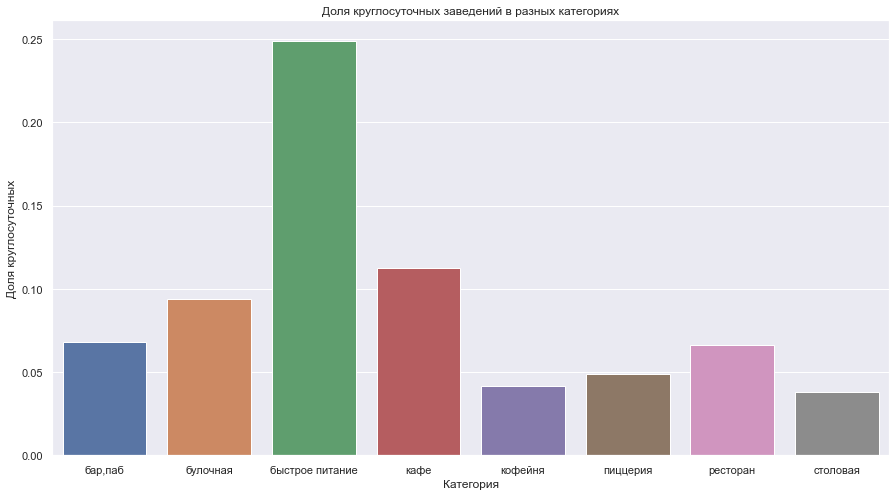

In [48]:
t = df.groupby('category').agg({'24/7': 'sum', 'name': 'count'})\
.reset_index()\
.rename(columns={'name': 'total'})

t['24/7 pct'] = t['24/7']/t['total'].round(2)

ax = sns.barplot(x='category', y='24/7 pct', data=t)
plt.title('Доля круглосуточных заведений в разных категориях')
plt.ylabel('Доля круглосуточных')
plt.xlabel('Категория')
plt.show()

- Около четверти заведений быстрого питания работают круглосуточно;
- Доля круглосуточных заведения в остальных категориях 5-10%;
- Наименьшие доли круглосуточных среди кофеен и столовых.

### Общий вывод

- Наибольшее количество заведений в категориях - "кафе" и "рестораны". Наименьшее - в булочных и столовых;
- Разница в среднем количестве посадочных мест между категориями заведений не значительная;
- Несетевых заведений примерно в 1,5 раза больше, чем сетевых;
- Обычно количество несетевых заведений значительно превышает количество сетевых в рамках одной категории;
- Лидеры по количеству заведений среди сетей - Шоколадница, Домино'с пицца и Додо пицца;
- Среди ТОП-15 самых крупных сетей 5 кофеен;
- Количество заведений по почти всем категориям, открытых в центре, в несколько раз превышает количество заведений, открытых в других районах
- ТОП-3 категории заведений в центре - ресторан, кафе и кофейня;
- Минимальное количество заведений во всех категориях - на Северо-Западе;
- Лучшие по среднему рейтингу заведения - в Центральном районе. Однако сами средние рейтинги между районами отличаются не сильно: максимальный - 4.4, минимальный - 4.2;
- Самые популярные улицы по количеству заведений: проспект Мира, Профсоюзная улица, проспект Вернадского и Ленинский проспект;
- Наибольшие средние чеки в ресторанах Центра, Запада и Северо-Запада;
- Наименьший средний чек у ресторанов Северо-Востока, Юга и Юго-Востока;
- Около четверти заведений быстрого питания работают круглосуточно. 

## Анализ идеи открытия кофейни

### Распределение кофеен по районам

Посмотрим, сколько всего кофеен в нашей выборке

In [49]:
coffee = df[df['category']=='кофейня']
len(coffee)

1413

Конкуренция в сфере кофеен серьезная. По нашим данным, всего их в Москве 1413.

Посмотрим, как они распределены по районам.

In [50]:
t = coffee.groupby('district', as_index=False)['name'].count()\
.sort_values(by='name', ascending=False)\
.rename(columns={'name': 'names_count'})
t

,district,names_count
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


In [51]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=9.5)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=t,
    columns=['district', 'names_count'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Количество коффеен',
).add_to(m)

# выводим карту
m

- Лидер по количеству кофеен - Центр;
- На втором месте по количеству кофеен - Север, но там их примерно в 2 раза меньше, чем в Центре;
- Районы с наименьшим количеством кофеен: Юго-Запад, Юго-Восток и Северо-Запад.

### Круглосуточные кофейни

Посмотрим, на долю круглосуточных кофеен.

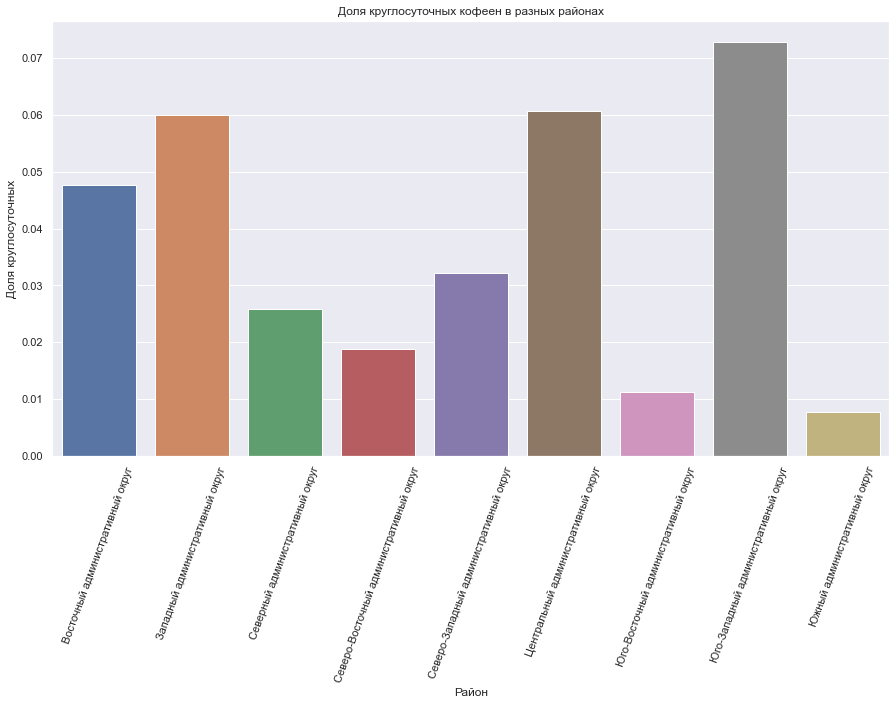

In [52]:
t = coffee.groupby('district').agg({'24/7': 'sum', 'name': 'count'})\
.reset_index()\
.rename(columns={'name': 'total'})

t['24/7 pct'] = t['24/7']/t['total'].round(2)

ax = sns.barplot(x='district', y='24/7 pct', data=t)
plt.title('Доля круглосуточных кофеен в разных районах')
plt.ylabel('Доля круглосуточных')
plt.xlabel('Район')
plt.xticks(rotation=70)
plt.show()

Максимальная доля круглосуточных кофеен на Юго-Западе, который мы предлагаем рассмотреть для открытия кофейни наших клиентов.

Но даже там эта доля составляет всего 7%.

### Рейтинги кофеен в разных районах

In [53]:
t = coffee.groupby('district', as_index=False).agg({'rating': 'median'})

t

,district,rating
0,Восточный административный округ,4.3
1,Западный административный округ,4.2
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3


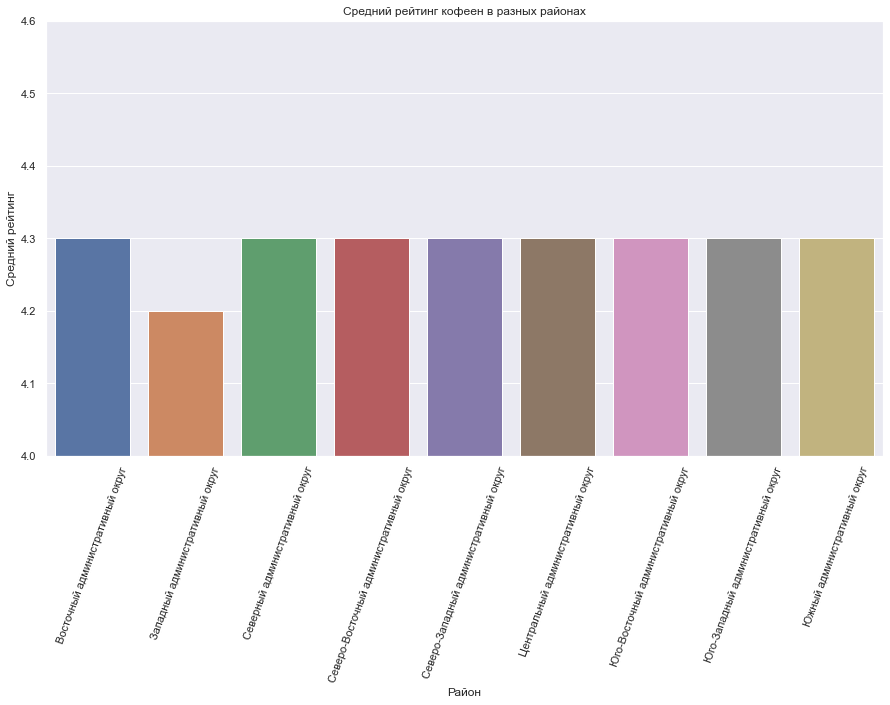

In [54]:
ax = sns.barplot(x='district', y='rating', data=t)
plt.title('Средний рейтинг кофеен в разных районах')
plt.ylabel('Средний рейтинг')
plt.xlabel('Район')
ax.set_ylim([4, 4.6])
plt.xticks(rotation=70)
plt.show()

- Средний рейтинг во всех районах, кроме Западного, составляет 4.3. В Западном - 4.2;

- Опираться на метрику среднего рейтинга при открытии нового заведения, скорее всего, не стоит.

### Средняя стоимость чашки капучино в разных районах

Вероятно, что средняя стоимость чашки в сетевых кофейнях будет ниже, чем в несетевых, ввиду большей отлаженности процессов. Посмотрим так ли это. 

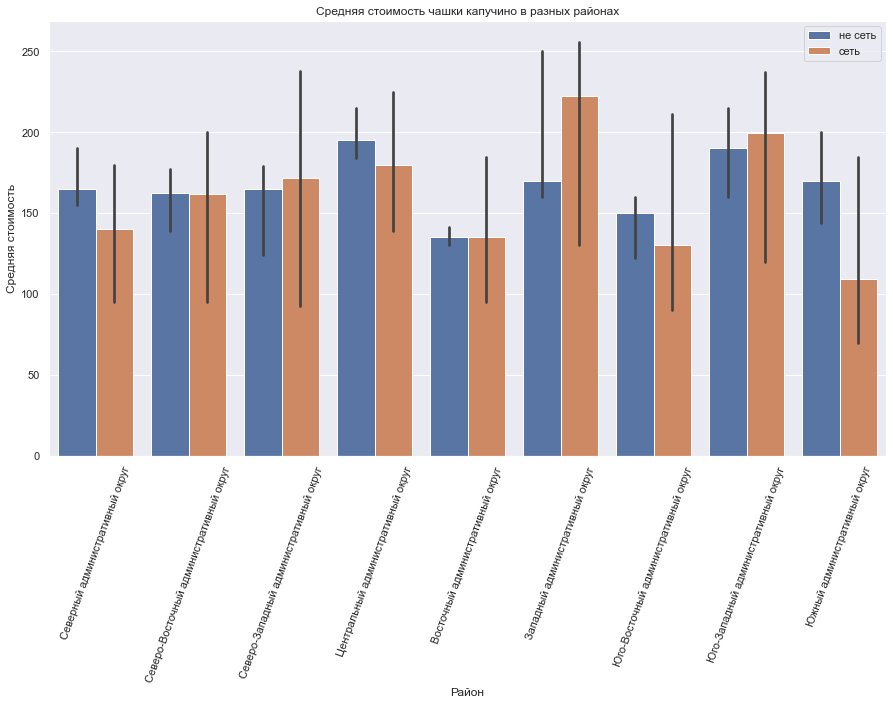

In [55]:
ax = sns.barplot(x='district', 
                 y='middle_coffee_cup', 
                 hue='chain',
                 data=coffee[coffee['middle_coffee_cup']!='нет информации'],
                 estimator=np.median)
plt.title('Средняя стоимость чашки капучино в разных районах')
plt.ylabel('Средняя стоимость')
plt.xlabel('Район')
L=plt.legend()
L.get_texts()[0].set_text('не сеть')
L.get_texts()[1].set_text('сеть')
plt.xticks(rotation=70)
plt.show()

Предположение не подтвердилось - явной взаимосвязи между тем, сетевая ли кофейня, и средней стоимостью чашки капучино не наблюдается.

При открытии на Юго-Западе стоит ориентироваться на 180-200 рублей за чашку.

### Доли сетевых кофеен в разных районах

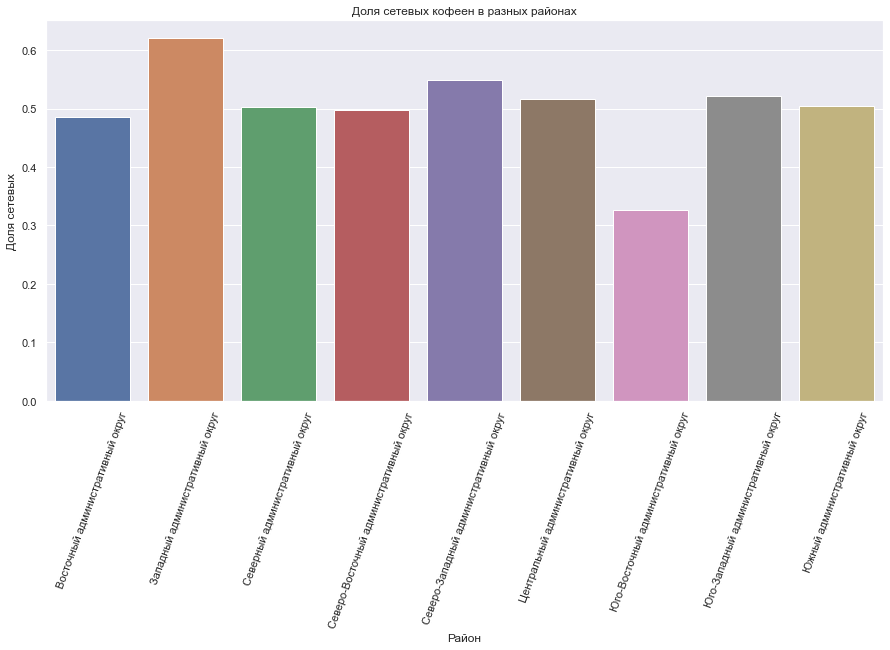

In [56]:
t = coffee.groupby('district').agg({'chain': 'sum', 'name': 'count'})\
.reset_index()\
.rename(columns={'name': 'total'})

t['chain pct'] = t['chain']/t['total'].round(2)

plt.figure(figsize=(15, 7))
ax = sns.barplot(x='district', y='chain pct', data=t)
plt.title('Доля сетевых кофеен в разных районах')
plt.ylabel('Доля сетевых')
plt.xlabel('Район')
plt.xticks(rotation=70)
plt.show()

- Около половины всех кофеен в каждом районе - сетевые;
- Выделяется Запад - там сетевых около 60%;
- В Юго-Восточном районе доля сетевых минимальна - около 30%. Это несет несколько плюсов: обычно сложно конкурировать с сетевыми заведениями в цене, а люди часто ищут знакомые названия.

### Распределение количества посадочных мест в кофейнях

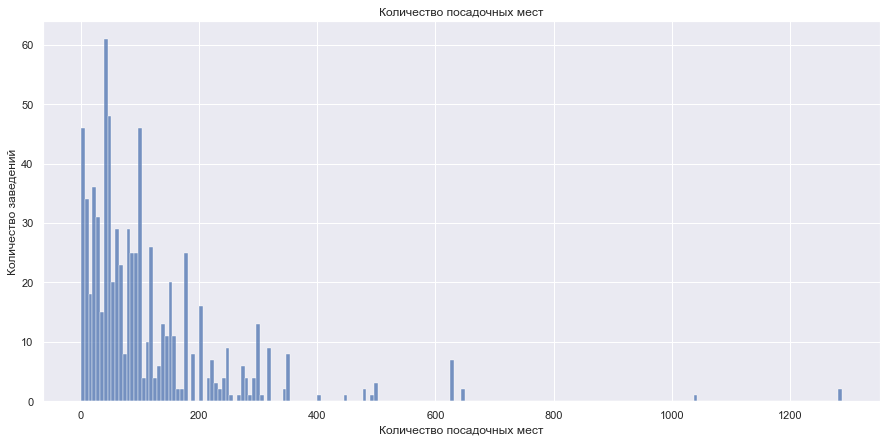

In [57]:
plt.figure(figsize=(15, 7))
ax = sns.histplot(x='seats', 
                 data=coffee[(coffee['seats']!='нет информации')],
                 bins=200)
plt.title('Количество посадочных мест')
plt.ylabel('Количество заведений')
plt.xlabel('Количество посадочных мест')
plt.show()

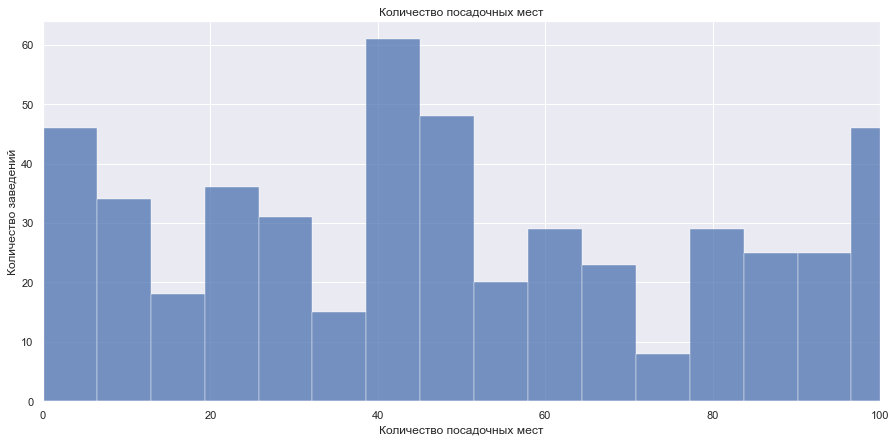

In [58]:
plt.figure(figsize=(15, 7))
ax = sns.histplot(x='seats', 
                 data=coffee[(coffee['seats']!='нет информации')],
                 bins=200)
ax.set_xlim([0, 100])
plt.title('Количество посадочных мест')
plt.ylabel('Количество заведений')
plt.xlabel('Количество посадочных мест')
plt.show()

- Большая часть кофеен в Москве располагает количеством посадочных мест от 0 до 200;

- Многие кофейни, судя по отсутствию посадочных мест, работают только на вынос;

- Большинство кофеен имеет около 40 посадочных мест;

- Эту информацию носит скорее обзорных характер, нежели рекомендательный для открытия будущего заведения.

### Выводы по идее открытия кофейни

- Конкуренция среди кофеен в Москве велика - открыто уже 1413 заведений. Наибольшее их количество в Центре, наименьшее на  Юго-Западе, Юго-Востоке и Северо-Западе;
- Круглосуточных кофеен во всех районах не очень много, их доля не превышает 7%;
- Средний рейтинг во всех районах, кроме Западного, составляет 4.3. В Западном - 4.2;
- Около половины всех кофеен во всех районах, кроме Юго-Восточного - сетевые. На Юго-Востоке их около 30%;
- Большая часть кофеен в Москве располагает количеством посадочных мест от 0 до 200. Многие кофейни, судя по отсутствию посадочных мест, работают только на вынос. Большинство кофеен имеет около 40 посадочных мест.

Учитывая пожелания от наших клиентов о кофейни как о точке ежедневного сбора друзей, можно предложить им рассмотреть Юго-Восточное направление. Причин для этого несколько:
- конкуренция в категории кофеен там пока что не такая высокая, как во многих других районах;
- однако высокие показатели по количеству кафе и ресторанов свидетельствуют о хорошей покупательской активности в этом районе;
- потенциально можно стать тем самым уютным местом недалеко от дома, в которое люди заходят за кофе во время летней прогулки или чтобы согреться зимой.


При открытии стоит ориентироваться на 180-200 рублей за чашку капучино.

Презентация: https://disk.yandex.ru/i/Rs3L5zOtL8eo1A